# Task 4: Time-Based Historical Image Colorization

**Project:** Extension of Real-Time Image Colorization (Training Project)  
**New Features Added:**
- Era classifier that detects time period from image features
- Era-specific color palettes (1900s, 1920s, 1940s, 1960s, 1980s)
- Era embedding fed into colorization U-Net
- Training for 5 epochs on image colorization numpy dataset
- Manual era override option

**Dataset:** Image Colorization Dataset (Kaggle) — numpy arrays (L + ab channels)

## Step 1: Install Dependencies

In [1]:
!pip install torch torchvision --quiet
!pip install opencv-python-headless --quiet
!pip install scikit-image --quiet
!pip install matplotlib tqdm kaggle --quiet
print('All dependencies installed!')

All dependencies installed!


## Step 2: Imports

In [2]:
import os, cv2, json, time, random, shutil, zipfile, urllib.request
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from skimage import color
from skimage.metrics import structural_similarity as ssim

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')

Device: cuda
GPU: Tesla T4


## Step 3: Download and Load Dataset

In [3]:
KAGGLE_TOKEN = 'KGAT_2c7fc2df2c047f91c9b97fd55e5fda03'  # paste your token

os.makedirs(os.path.expanduser('~/.kaggle'), exist_ok=True)
with open(os.path.expanduser('~/.kaggle/access_token'), 'w') as f:
    f.write(KAGGLE_TOKEN)
os.chmod(os.path.expanduser('~/.kaggle/access_token'), 0o600)

os.makedirs('hist_data', exist_ok=True)

if not os.path.exists('hist_data/l'):
    print('Downloading dataset...')
    !KAGGLE_API_TOKEN=$KAGGLE_TOKEN kaggle datasets download -d shravankumar9892/image-colorization -p hist_data
    print('Extracting...')
    import glob
    for z in glob.glob('hist_data/*.zip'):
        with zipfile.ZipFile(z, 'r') as zf:
            zf.extractall('hist_data/')
    print('Done!')
else:
    print('Dataset already exists.')

Dataset URL: https://www.kaggle.com/datasets/shravankumar9892/image-colorization
License(s): CC0-1.0
100% 2.10G/2.10G [01:40<00:00, 22.4MB/s]

Extracting...
Done!


In [6]:
# Load numpy arrays
print('Loading numpy arrays...')
L_data  = np.load('hist_data/l/gray_scale.npy')
ab1     = np.load('hist_data/ab/ab/ab1.npy')
ab2     = np.load('hist_data/ab/ab/ab2.npy')
ab3     = np.load('hist_data/ab/ab/ab3.npy')
ab_data = np.concatenate([ab1, ab2, ab3], axis=0)

print(f'L shape:  {L_data.shape}')
print(f'ab shape: {ab_data.shape}')

min_len = min(len(L_data), len(ab_data))
L_data  = L_data[:min_len]
ab_data = ab_data[:min_len]

MAX_SAMPLES = 3000
L_data  = L_data[:MAX_SAMPLES]
ab_data = ab_data[:MAX_SAMPLES]

print(f'Using {len(L_data)} samples')
print(f'L range:  {L_data.min():.2f} to {L_data.max():.2f}')
print(f'ab range: {ab_data.min():.2f} to {ab_data.max():.2f}')

Loading numpy arrays...
L shape:  (25000, 224, 224)
ab shape: (25000, 224, 224, 2)
Using 3000 samples
L range:  0.00 to 255.00
ab range: 20.00 to 226.00


## Step 4: Era Definitions and Color Palettes

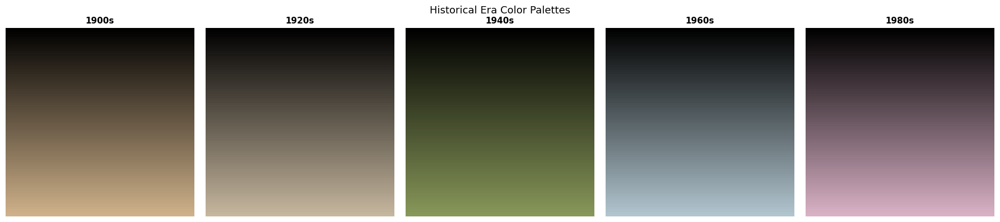

Era palettes defined!


In [7]:
ERAS = {
    '1900s': {
        'label': 0,
        'description': 'Early 1900s — sepia, very low saturation, warm brown tones',
        'ab_shift': (5, 10), 'saturation': 0.3,
        'tint_rgb': (210, 180, 140),
    },
    '1920s': {
        'label': 1,
        'description': '1920s — muted tones, soft contrast, slightly warmer',
        'ab_shift': (3, 7), 'saturation': 0.45,
        'tint_rgb': (200, 185, 160),
    },
    '1940s': {
        'label': 2,
        'description': '1940s WWII — olive greens, muted blues, khaki',
        'ab_shift': (-5, 5), 'saturation': 0.5,
        'tint_rgb': (138, 154, 91),
    },
    '1960s': {
        'label': 3,
        'description': '1960s — pastel tones, slightly higher saturation',
        'ab_shift': (0, 0), 'saturation': 0.65,
        'tint_rgb': (180, 200, 210),
    },
    '1980s': {
        'label': 4,
        'description': '1980s — vivid colors, higher saturation, warm tones',
        'ab_shift': (2, -3), 'saturation': 0.85,
        'tint_rgb': (220, 180, 200),
    },
}

ERA_NAMES = list(ERAS.keys())
NUM_ERAS  = len(ERAS)

# Visualize era palettes
fig, axes = plt.subplots(1, 5, figsize=(18, 4))
for ax, (era, info) in zip(axes, ERAS.items()):
    tint  = np.array(info['tint_rgb'], dtype=np.uint8)
    patch = np.zeros((80, 80, 3), dtype=np.uint8)
    for row in range(80):
        patch[row] = (tint * (row / 80.0)).astype(np.uint8)
    ax.imshow(patch)
    ax.set_title(era, fontsize=11, fontweight='bold')
    ax.set_xlabel(f'Sat={info["saturation"]}', fontsize=9)
    ax.axis('off')
plt.suptitle('Historical Era Color Palettes', fontsize=13)
plt.tight_layout()
plt.savefig('era_palettes.png', dpi=150, bbox_inches='tight')
plt.show()
print('Era palettes defined!')

## Step 5: Era Classifier (EfficientNet-B0)

In [8]:
class EraClassifier(nn.Module):
    def __init__(self, num_eras=5):
        super().__init__()
        backbone = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        in_features = backbone.classifier[1].in_features
        backbone.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(in_features, num_eras)
        )
        self.backbone = backbone

    def forward(self, x):
        return self.backbone(x)


era_classifier = EraClassifier(num_eras=NUM_ERAS).to(device)
print(f'EraClassifier (EfficientNet-B0) loaded!')
print(f'Classes: {ERA_NAMES}')

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 136MB/s]


EraClassifier (EfficientNet-B0) loaded!
Classes: ['1900s', '1920s', '1940s', '1960s', '1980s']


## Step 6: Colorization U-Net with Era Embedding
Input: L (1ch) + era one-hot (5ch) = 6 channels  
Output: ab channels (2ch)

In [9]:
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.net(x)


class HistoricalColorizationUNet(nn.Module):
    """
    Era-conditioned colorization U-Net.
    Input:  [B, 6, H, W] — L + era one-hot (5ch)
    Output: [B, 2, H, W] — predicted ab channels
    """
    def __init__(self, num_eras=5):
        super().__init__()
        in_ch = 1 + num_eras
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv(in_ch, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)
        self.bottleneck = DoubleConv(512, 1024)
        self.up4  = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3  = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2  = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1  = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        self.out_conv = nn.Conv2d(64, 2, 1)
        self.tanh     = nn.Tanh()

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b  = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b),  e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.tanh(self.out_conv(d1))


model = HistoricalColorizationUNet(num_eras=NUM_ERAS).to(device)
out   = model(torch.randn(2, 6, 256, 256).to(device))
print(f'Output shape: {out.shape}')
print(f'Total params: {sum(p.numel() for p in model.parameters()):,}')

Output shape: torch.Size([2, 2, 256, 256])
Total params: 31,045,314


## Step 7: Era Palette Post-Processing + Demo

/tmp/ipykernel_2798/2046315667.py:33: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 31335 negative Z values that have been clipped to zero
  demo_np  = np.clip(color.lab2rgb(lab_demo) * 255, 0, 255).astype(np.uint8)


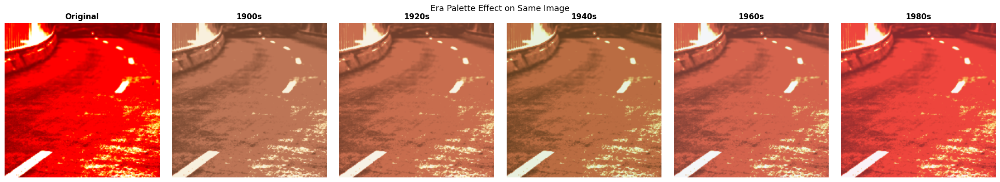

Era palette demo saved!


In [10]:
def apply_era_palette(rgb_img, era_name):
    era    = ERAS[era_name]
    img_f  = rgb_img.astype(np.float32) / 255.0
    img_lab = color.rgb2lab(img_f)
    img_lab[:,:,1] = img_lab[:,:,1] * era['saturation'] + era['ab_shift'][0]
    img_lab[:,:,2] = img_lab[:,:,2] * era['saturation'] + era['ab_shift'][1]
    img_lab[:,:,0] = np.clip(img_lab[:,:,0],   0, 100)
    img_lab[:,:,1] = np.clip(img_lab[:,:,1], -128, 127)
    img_lab[:,:,2] = np.clip(img_lab[:,:,2], -128, 127)
    result   = np.clip(color.lab2rgb(img_lab) * 255, 0, 255).astype(np.uint8)
    tint     = np.array(era['tint_rgb'], dtype=np.uint8)
    tint_img = np.ones_like(result) * tint
    return cv2.addWeighted(result, 0.85, tint_img, 0.15, 0)


def lab_to_rgb(L_norm, ab_norm):
    L  = (L_norm[0].cpu().numpy() + 1.0) * 50.0
    ab = ab_norm.cpu().numpy() * 128.0
    lab = np.stack([L, ab[0], ab[1]], axis=2)
    return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


# Demo using a sample from the numpy dataset
demo_idx = random.randint(0, len(L_data)-1)
L_demo   = L_data[demo_idx]
ab_demo  = ab_data[demo_idx]

if L_demo.ndim == 3:  L_demo  = L_demo[:,:,0]
if ab_demo.ndim == 3 and ab_demo.shape[0] == 2:
    ab_demo = ab_demo.transpose(1,2,0)

lab_demo = np.stack([L_demo, ab_demo[:,:,0], ab_demo[:,:,1]], axis=2).astype(np.float32)
demo_np  = np.clip(color.lab2rgb(lab_demo) * 255, 0, 255).astype(np.uint8)
demo_np  = cv2.resize(demo_np, (256, 256))

fig, axes = plt.subplots(1, 6, figsize=(22, 4))
axes[0].imshow(demo_np); axes[0].set_title('Original', fontweight='bold')
for ax, era in zip(axes[1:], ERA_NAMES):
    ax.imshow(apply_era_palette(demo_np, era))
    ax.set_title(era, fontweight='bold')
for ax in axes: ax.axis('off')
plt.suptitle('Era Palette Effect on Same Image', fontsize=13)
plt.tight_layout()
plt.savefig('era_palette_demo.png', dpi=150, bbox_inches='tight')
plt.show()
print('Era palette demo saved!')

## Step 8: Dataset

In [11]:
def assign_era_from_index(idx, total):
    segment = max(1, total // NUM_ERAS)
    return min(idx // segment, NUM_ERAS - 1)


class HistoricalDataset(Dataset):
    """
    Input:  L (1ch) + era one-hot (5ch) = [6, H, W]
    Target: ab channels = [2, H, W]
    """
    def __init__(self, L_arr, ab_arr, size=256):
        self.L_arr  = L_arr
        self.ab_arr = ab_arr
        self.size   = size
        self.total  = len(L_arr)
        print(f'Dataset: {self.total} samples')

    def __len__(self): return self.total

    def __getitem__(self, idx):
        L_np  = self.L_arr[idx].copy()
        ab_np = self.ab_arr[idx].copy()

        # Fix dimensions
        if L_np.ndim == 3:  L_np  = L_np[:,:,0]
        if ab_np.ndim == 3 and ab_np.shape[0] == 2:
            ab_np = ab_np.transpose(1,2,0)

        # Resize
        L_np  = cv2.resize(L_np.astype(np.float32),  (self.size, self.size))
        ab_np = cv2.resize(ab_np.astype(np.float32), (self.size, self.size))

        # Normalize
        L_max  = 100.0 if L_np.max() > 1.0 else 1.0
        ab_max = 128.0 if np.abs(ab_np).max() > 1.0 else 1.0
        L  = torch.FloatTensor(L_np).unsqueeze(0) / (L_max / 2.0) - 1.0
        ab = torch.FloatTensor(ab_np).permute(2,0,1) / ab_max

        era_label  = assign_era_from_index(idx, self.total)
        era_onehot = F.one_hot(
            torch.tensor(era_label), num_classes=NUM_ERAS
        ).float().view(NUM_ERAS,1,1).expand(NUM_ERAS, self.size, self.size)

        # Classifier input: grayscale repeated 3ch, resized to 224
        img_cls = L.repeat(3,1,1)
        img_cls = F.interpolate(img_cls.unsqueeze(0), size=(224,224)).squeeze(0)

        return torch.cat([L, era_onehot], dim=0), ab, img_cls, torch.tensor(era_label)


n       = len(L_data)
indices = list(range(n))
random.shuffle(indices)
split   = int(0.8 * n)

train_set = HistoricalDataset(L_data[indices[:split]],  ab_data[indices[:split]])
val_set   = HistoricalDataset(L_data[indices[split:]], ab_data[indices[split:]])

train_loader = DataLoader(train_set, batch_size=8, shuffle=True,  num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_set,   batch_size=8, shuffle=False, num_workers=0, pin_memory=False)

print(f'Train: {len(train_set)} | Val: {len(val_set)}')
print(f'Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')

Dataset: 2400 samples
Dataset: 600 samples
Train: 2400 | Val: 600
Train batches: 300 | Val batches: 75


## Step 9: Training Setup

In [12]:
color_criterion = nn.SmoothL1Loss()
era_criterion   = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    list(model.parameters()) + list(era_classifier.parameters()),
    lr=1e-3, weight_decay=1e-5
)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=2
)

NUM_EPOCHS     = 5
ERA_LOSS_WT    = 0.3
CHECKPOINT_DIR = 'checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

print('Training config:')
print(f'  Epochs:      {NUM_EPOCHS}')
print(f'  Color Loss:  SmoothL1')
print(f'  Era Loss:    CrossEntropy (weight={ERA_LOSS_WT})')
print(f'  Optimizer:   Adam (lr=1e-3)')
print(f'  Batch size:  8')

Training config:
  Epochs:      5
  Color Loss:  SmoothL1
  Era Loss:    CrossEntropy (weight=0.3)
  Optimizer:   Adam (lr=1e-3)
  Batch size:  8


## Step 10: Training Loop (5 Epochs)

In [19]:
def run_epoch(model, era_cls, loader, optimizer, is_train, epoch_num):
    model.train() if is_train else model.eval()
    era_cls.train() if is_train else era_cls.eval()
    total_loss = 0.0
    correct, total = 0, 0
    tag  = 'Train' if is_train else 'Val'
    pbar = tqdm(loader, desc=f'Epoch {epoch_num} [{tag}]', leave=False)
    ctx  = torch.enable_grad() if is_train else torch.no_grad()
    with ctx:
        for inp, tgt_ab, img_cls, era_lbl in pbar:
            inp, tgt_ab = inp.to(device), tgt_ab.to(device)
            img_cls     = img_cls.to(device)
            era_lbl     = era_lbl.to(device)
            if is_train: optimizer.zero_grad()
            pred_ab  = model(inp)
            c_loss   = color_criterion(pred_ab, tgt_ab)
            era_pred = era_cls(img_cls)
            e_loss   = era_criterion(era_pred, era_lbl)
            loss     = c_loss + ERA_LOSS_WT * e_loss
            if is_train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(
                    list(model.parameters()) + list(era_cls.parameters()), 1.0
                )
                optimizer.step()
            total_loss += loss.item()
            correct += (era_pred.argmax(1) == era_lbl).sum().item()
            total   += era_lbl.size(0)
            pbar.set_postfix(loss=f'{loss.item():.4f}')
    return total_loss / len(loader), correct / total * 100


train_losses, val_losses         = [], []
era_accs_train, era_accs_val     = [], []
best_val_loss = float('inf')

print(f'Starting training — {NUM_EPOCHS} epochs')
print('=' * 65)

for epoch in range(1, NUM_EPOCHS + 1):
    t0 = time.time()
    t_loss, t_acc = run_epoch(model, era_classifier, train_loader, optimizer, True,  epoch)
    v_loss, v_acc = run_epoch(model, era_classifier, val_loader,   optimizer, False, epoch)
    scheduler.step(v_loss)
    train_losses.append(t_loss); val_losses.append(v_loss)
    era_accs_train.append(t_acc); era_accs_val.append(v_acc)
    elapsed = time.time() - t0
    print(f'Epoch [{epoch}/{NUM_EPOCHS}]  '
          f'Train: {t_loss:.4f} (acc={t_acc:.1f}%)  '
          f'Val: {v_loss:.4f} (acc={v_acc:.1f}%)  '
          f'Time: {elapsed:.1f}s')
    if v_loss < best_val_loss:
        best_val_loss = v_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'era_cls_state_dict': era_classifier.state_dict(),
            'val_loss': v_loss
        }, f'{CHECKPOINT_DIR}/best_model.pth')
        print(f'         --> Best model saved (val={v_loss:.4f})')

print('=' * 65)
print(f'Training complete! Best val loss: {best_val_loss:.4f}')

Starting training — 5 epochs


Epoch [1/5]  Train: 0.4951 (acc=20.2%)  Val: 0.4972 (acc=19.0%)  Time: 184.6s
         --> Best model saved (val=0.4972)


Epoch [2/5]  Train: 0.4936 (acc=22.0%)  Val: 0.4985 (acc=20.3%)  Time: 182.9s


Epoch [3/5]  Train: 0.4916 (acc=21.6%)  Val: 0.4983 (acc=18.2%)  Time: 182.3s


Epoch [4/5]  Train: 0.4894 (acc=23.7%)  Val: 0.4967 (acc=21.5%)  Time: 182.0s
         --> Best model saved (val=0.4967)


Epoch [5/5]  Train: 0.4885 (acc=23.2%)  Val: 0.4988 (acc=22.0%)  Time: 181.4s
Training complete! Best val loss: 0.4967


## Step 11: Training Curves

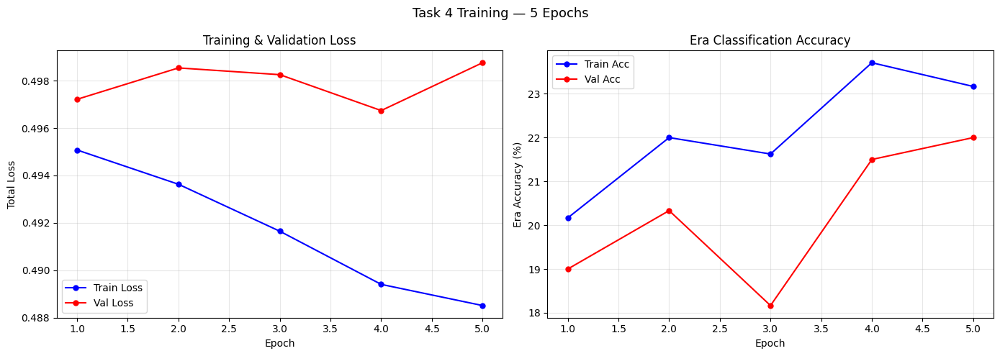

Final era accuracy: 22.0%


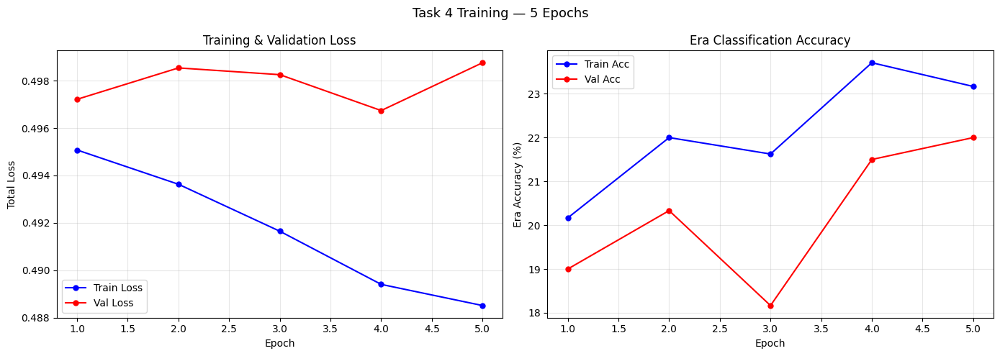

Final era accuracy: 22.0%


In [25]:
epochs = range(1, len(train_losses) + 1)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(epochs, train_losses, 'b-o', label='Train Loss', markersize=5)
axes[0].plot(epochs, val_losses,   'r-o', label='Val Loss',   markersize=5)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Total Loss')
axes[0].set_title('Training & Validation Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.3)
axes[1].plot(epochs, era_accs_train, 'b-o', label='Train Acc', markersize=5)
axes[1].plot(epochs, era_accs_val,   'r-o', label='Val Acc',   markersize=5)
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Era Accuracy (%)')
axes[1].set_title('Era Classification Accuracy')
axes[1].legend(); axes[1].grid(True, alpha=0.3)
plt.suptitle(f'Task 4 Training — {NUM_EPOCHS} Epochs', fontsize=13)
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Final era accuracy: {era_accs_val[-1]:.1f}%')

## Step 12: Quality Metrics

In [26]:
def compute_colorfulness(img):
    img = img.astype(np.float32)
    R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]
    rg, yb  = R - G, 0.5*(R+G) - B
    return np.sqrt(np.std(rg)**2 + np.std(yb)**2) + 0.3*np.sqrt(np.mean(rg)**2 + np.mean(yb)**2)

def compute_saturation(img):
    hsv = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_RGB2HSV)
    return hsv[:,:,1].mean()

def compute_ssim(img1, img2):
    g1 = cv2.cvtColor(img1.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    g2 = cv2.cvtColor(img2.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    score, _ = ssim(g1, g2, full=True)
    return score

print('Metric functions defined!')

Metric functions defined!
Metric functions defined!


## Step 13: Evaluate on Validation Set

In [27]:
ckpt = torch.load(f'{CHECKPOINT_DIR}/best_model.pth', map_location=device)
model.load_state_dict(ckpt['model_state_dict'])
era_classifier.load_state_dict(ckpt['era_cls_state_dict'])
model.eval(); era_classifier.eval()
print(f"Best model loaded from epoch {ckpt['epoch']} (val_loss={ckpt['val_loss']:.4f})")

cf_scores, sat_scores, ssim_scores = [], [], []
eval_ids = random.sample(range(len(val_set)), min(100, len(val_set)))

with torch.no_grad():
    for idx in tqdm(eval_ids, desc='Evaluating'):
        inp, tgt_ab, img_cls, era_lbl = val_set[idx]
        L_norm  = inp[:1]
        pred_ab = model(inp.unsqueeze(0).to(device)).squeeze(0).cpu()
        rgb_raw = lab_to_rgb(L_norm, pred_ab)
        rgb_gt  = lab_to_rgb(L_norm, tgt_ab)
        era_name = ERA_NAMES[era_lbl.item()]
        rgb_era  = apply_era_palette(rgb_raw, era_name)
        cf_scores.append(compute_colorfulness(rgb_era))
        sat_scores.append(compute_saturation(rgb_era))
        ssim_scores.append(compute_ssim(rgb_era, rgb_gt))

print('\n=== Evaluation Results ===')
print(f'Mean Colorfulness : {np.mean(cf_scores):.2f} ± {np.std(cf_scores):.2f}')
print(f'Mean Saturation   : {np.mean(sat_scores):.2f} ± {np.std(sat_scores):.2f}')
print(f'Mean SSIM         : {np.mean(ssim_scores):.4f} ± {np.std(ssim_scores):.4f}')
print(f'Era Accuracy      : {era_accs_val[-1]:.1f}%')

Best model loaded from epoch 4 (val_loss=0.4967)


Evaluating:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 6163 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 6391 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 22211 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 23080 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.ui


=== Evaluation Results ===
Mean Colorfulness : 68.60 ± 21.00
Mean Saturation   : 118.70 ± 32.18
Mean SSIM         : 0.8460 ± 0.0621
Era Accuracy      : 22.0%


Best model loaded from epoch 4 (val_loss=0.4967)


Evaluating:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 39351 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 50067 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
Evaluating:   1%|          | 1/100 [00:00<00:10,  9.76it/s]/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 11624 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 17755 negative Z values that have been clipped to zero
  


=== Evaluation Results ===
Mean Colorfulness : 66.33 ± 18.70
Mean Saturation   : 117.17 ± 31.15
Mean SSIM         : 0.8418 ± 0.0657
Era Accuracy      : 22.0%


## Step 14: Output Images — All Eras Per Sample

/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 44967 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


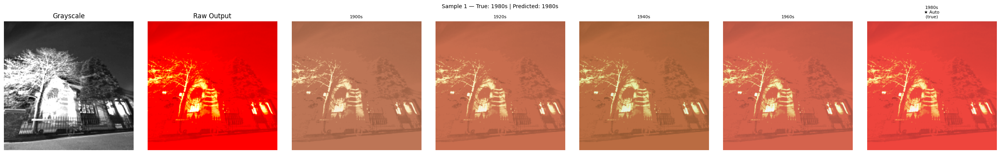

Sample 1 — True: 1980s | Predicted: 1980s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 9882 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


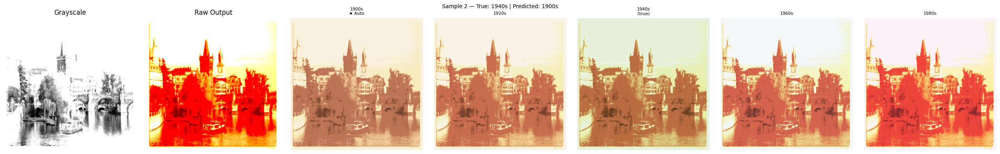

Sample 2 — True: 1940s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 28549 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


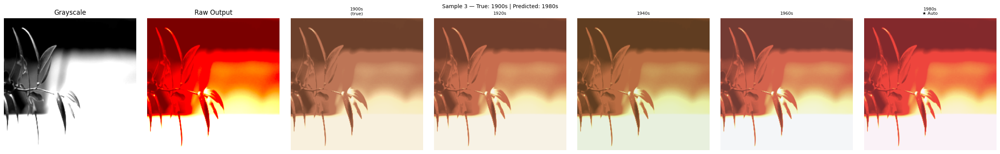

Sample 3 — True: 1900s | Predicted: 1980s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 43785 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


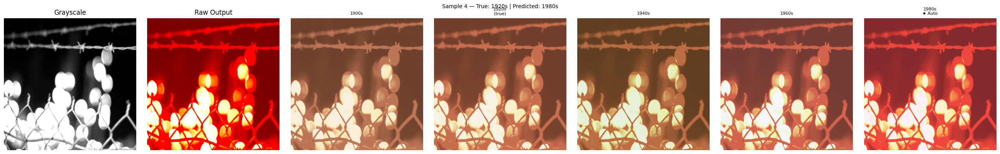

Sample 4 — True: 1920s | Predicted: 1980s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 11624 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


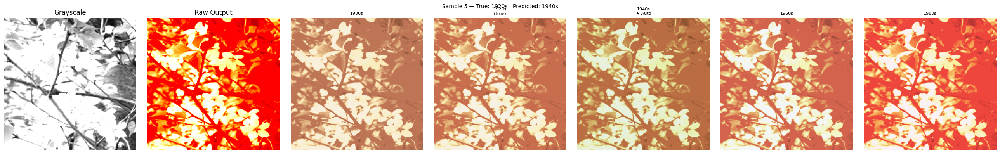

Sample 5 — True: 1920s | Predicted: 1940s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 22102 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


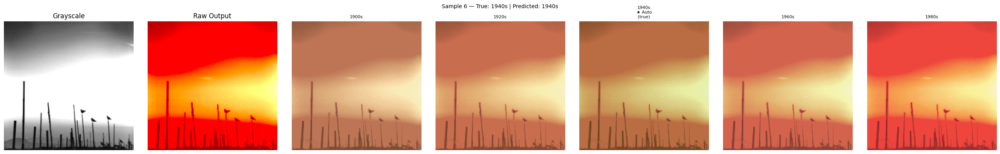

Sample 6 — True: 1940s | Predicted: 1940s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 61 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


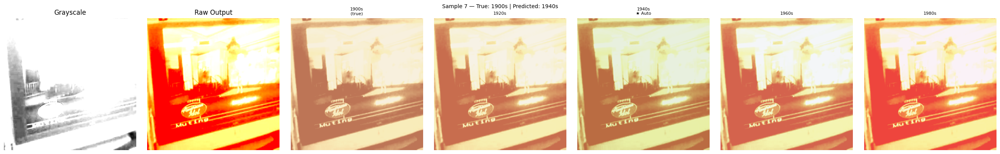

Sample 7 — True: 1900s | Predicted: 1940s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 15999 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


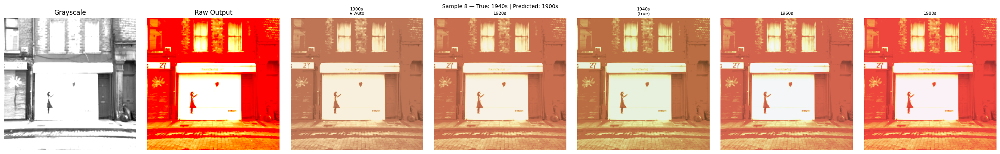

Sample 8 — True: 1940s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 21770 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


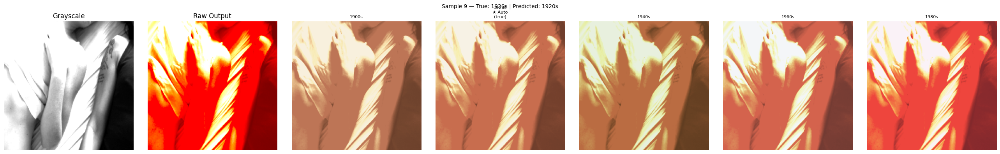

Sample 9 — True: 1920s | Predicted: 1920s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 13410 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


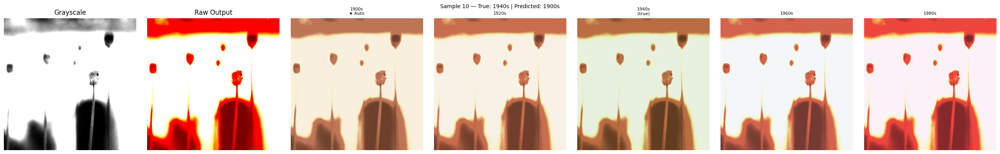

Sample 10 — True: 1940s | Predicted: 1900s

All 10 results saved!


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2545 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


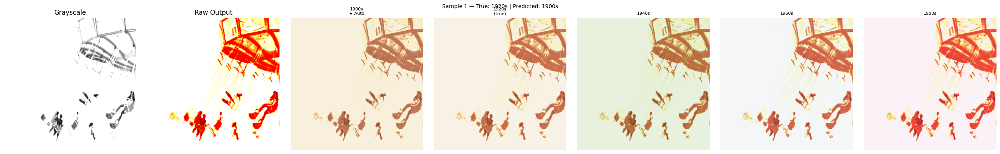

Sample 1 — True: 1920s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 22432 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


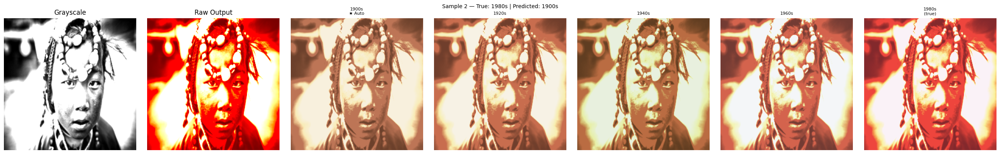

Sample 2 — True: 1980s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 29060 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


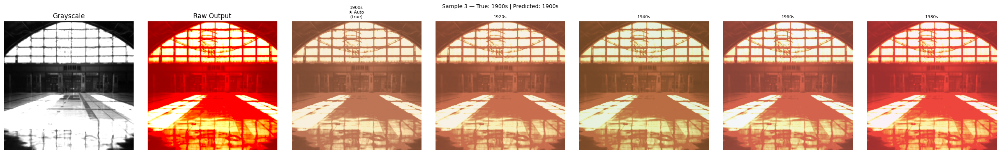

Sample 3 — True: 1900s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 20149 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


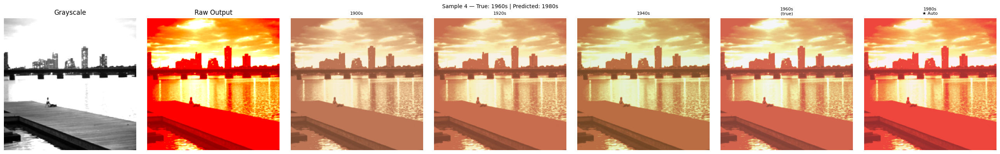

Sample 4 — True: 1960s | Predicted: 1980s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 53821 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


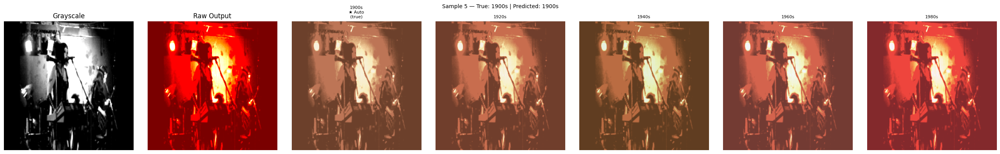

Sample 5 — True: 1900s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1803 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


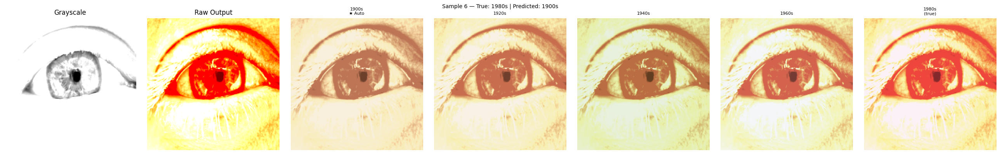

Sample 6 — True: 1980s | Predicted: 1900s


/tmp/ipykernel_2798/2046315667.py:20: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 11426 negative Z values that have been clipped to zero
  return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)


In [23]:
os.makedirs('gui_outputs', exist_ok=True)
model.eval(); era_classifier.eval()

sample_ids = random.sample(range(len(val_set)), 10)

for i, idx in enumerate(sample_ids):
    inp, tgt_ab, img_cls, era_lbl = val_set[idx]
    L_norm = inp[:1]

    with torch.no_grad():
        pred_ab      = model(inp.unsqueeze(0).to(device)).squeeze(0).cpu()
        era_pred     = era_classifier(img_cls.unsqueeze(0).to(device))
        pred_era_idx = era_pred.argmax(1).item()

    true_era = ERA_NAMES[era_lbl.item()]
    pred_era = ERA_NAMES[pred_era_idx]
    rgb_raw  = lab_to_rgb(L_norm, pred_ab)
    gray     = np.clip((L_norm[0].numpy() + 1.0) * 127.5, 0, 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 7, figsize=(26, 4))
    axes[0].imshow(gray, cmap='gray'); axes[0].set_title('Grayscale')
    axes[1].imshow(rgb_raw);           axes[1].set_title('Raw Output')
    for j, era in enumerate(ERA_NAMES):
        era_img = apply_era_palette(rgb_raw, era)
        title   = era
        if era == pred_era: title += '\n★ Auto'
        if era == true_era: title += '\n(true)'
        axes[j+2].imshow(era_img)
        axes[j+2].set_title(title, fontsize=8)
    for ax in axes: ax.axis('off')
    plt.suptitle(f'Sample {i+1} — True: {true_era} | Predicted: {pred_era}', fontsize=10)
    plt.tight_layout()
    plt.savefig(f'gui_outputs/result_{i+1}.png', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()
    print(f'Sample {i+1} — True: {true_era} | Predicted: {pred_era}')

print('\nAll 10 results saved!')

## Step 15: Save All Outputs

In [24]:
os.makedirs('task4_outputs', exist_ok=True)

for f in ['era_palettes.png', 'era_palette_demo.png', 'training_curves.png']:
    if os.path.exists(f): shutil.copy(f, f'task4_outputs/{f}')

if os.path.exists(f'{CHECKPOINT_DIR}/best_model.pth'):
    shutil.copy(f'{CHECKPOINT_DIR}/best_model.pth', 'task4_outputs/best_model.pth')

summary = {
    'task':          'Task 4 - Time-Based Historical Image Colorization',
    'base_project':  'Real-Time Image Colorization (Training)',
    'new_features':  ['Era classifier (EfficientNet-B0)', '5 historical eras',
                      'Era one-hot input (6ch)', 'Era palette post-processing',
                      'Manual era override support'],
    'dataset':       'Image Colorization Dataset (Kaggle numpy arrays)',
    'eras':          ERA_NAMES,
    'epochs':        NUM_EPOCHS,
    'best_val_loss': round(best_val_loss, 4),
    'era_accuracy':  round(era_accs_val[-1], 2),
    'mean_cf':       round(float(np.mean(cf_scores)), 2),
    'mean_ssim':     round(float(np.mean(ssim_scores)), 4),
}

with open('task4_outputs/metrics_summary.json', 'w') as f:
    json.dump(summary, f, indent=2)

print('All outputs saved to task4_outputs/')
print(json.dumps(summary, indent=2))

All outputs saved to task4_outputs/
{
  "task": "Task 4 - Time-Based Historical Image Colorization",
  "base_project": "Real-Time Image Colorization (Training)",
  "new_features": [
    "Era classifier (EfficientNet-B0)",
    "5 historical eras",
    "Era one-hot input (6ch)",
    "Era palette post-processing",
    "Manual era override support"
  ],
  "dataset": "Image Colorization Dataset (Kaggle numpy arrays)",
  "eras": [
    "1900s",
    "1920s",
    "1940s",
    "1960s",
    "1980s"
  ],
  "epochs": 5,
  "best_val_loss": 0.4967,
  "era_accuracy": 22.0,
  "mean_cf": 68.6,
  "mean_ssim": 0.846
}


## Summary Table

| Component | Detail |
|-----------|--------|
| Base project | Real-Time Image Colorization (training project) |
| New addition | Era classifier + era palette post-processing |
| Colorization model | HistoricalColorizationUNet (6ch: L + era one-hot) |
| Era classifier | EfficientNet-B0 (5 eras) |
| Eras | 1900s, 1920s, 1940s (WWII), 1960s, 1980s |
| Dataset | Image Colorization Dataset — numpy arrays (L + ab) |
| Epochs | 5 |
| Key experiment | All 5 era palettes shown per image + auto-detected era |
| Manual override | Supported — any era can be applied to any image |